# 01.01 - PROYECTO KAGGLE

#Descarga y configuración del entorno

In [1]:
!wget --no-cache -O init.py -q https://raw.githubusercontent.com/rramosp/ai4eng.v1/main/content/init.py
import init; init.init(force_download=False); init.get_weblink()

replicating local resources


## download data directly from Kaggle

- create a file `kaggle.json` with your authentication token (in kaggle $\to$ click user icon on top-right $\to$ settings $\to$ API create new token)
- upload it to this notebook workspace
- run the following cell

In [2]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = '.'
!chmod 600 ./kaggle.json
!kaggle competitions download -c udea-ai-4-eng-20252-pruebas-saber-pro-colombia

  0% 0.00/29.9M [00:00<?, ?B/s]
100% 29.9M/29.9M [00:00<00:00, 890MB/s]


## unzip and inspect data

In [3]:
!unzip udea*.zip > /dev/null

In [4]:
!wc *.csv

   296787    296787   4716673 submission_example.csv
   296787   4565553  59185238 test.csv
   692501  10666231 143732437 train.csv
  1286075  15528571 207634348 total


## load `train.csv` data with pandas



In [5]:
import pandas as pd
import numpy as np

z = pd.read_csv("train.csv")
print ("shape of loaded dataframe", z.shape)


shape of loaded dataframe (692500, 21)


## Carga y exploración inicial de datos

In [7]:
z.head()

,ID,PERIODO_ACADEMICO,E_PRGM_ACADEMICO,E_PRGM_DEPARTAMENTO,E_VALORMATRICULAUNIVERSIDAD,E_HORASSEMANATRABAJA,F_ESTRATOVIVIENDA,F_TIENEINTERNET,F_EDUCACIONPADRE,F_TIENELAVADORA,...,E_PRIVADO_LIBERTAD,E_PAGOMATRICULAPROPIO,F_TIENECOMPUTADOR,F_TIENEINTERNET.1,F_EDUCACIONMADRE,RENDIMIENTO_GLOBAL,INDICADOR_1,INDICADOR_2,INDICADOR_3,INDICADOR_4
0,904256,20212,ENFERMERIA,BOGOTÁ,Entre 5.5 millones y menos de 7 millones,Menos de 10 horas,Estrato 3,Si,Técnica o tecnológica incompleta,Si,...,N,No,Si,Si,Postgrado,medio-alto,0.322,0.208,0.310,0.267
1,645256,20212,DERECHO,ATLANTICO,Entre 2.5 millones y menos de 4 millones,0,Estrato 3,No,Técnica o tecnológica completa,Si,...,N,No,Si,No,Técnica o tecnológica incompleta,bajo,0.311,0.215,0.292,0.264
2,308367,20203,MERCADEO Y PUBLICIDAD,BOGOTÁ,Entre 2.5 millones y menos de 4 millones,Más de 30 horas,Estrato 3,Si,Secundaria (Bachillerato) completa,Si,...,N,No,No,Si,Secundaria (Bachillerato) completa,bajo,0.297,0.214,0.305,0.264
3,470353,20195,ADMINISTRACION DE EMPRESAS,SANTANDER,Entre 4 millones y menos de 5.5 millones,0,Estrato 4,Si,No sabe,Si,...,N,No,Si,Si,Secundaria (Bachillerato) completa,alto,0.485,0.172,0.252,0.190
4,989032,20212,PSICOLOGIA,ANTIOQUIA,Entre 2.5 millones y menos de 4 millones,Entre 21 y 30 horas,Estrato 3,Si,Primaria completa,Si,...,N,No,Si,Si,Primaria completa,medio-bajo,0.316,0.232,0.285,0.294


## we will do a model using only two columns

- we have to predict column `RENDIMIENTO_GLOBAL` using the rest

- we will use columns
  - `E_PRGM_ACADEMICO`
  - `F_ESTRATOVIVIENDA`

In [8]:
z = z[['E_PRGM_ACADEMICO', 'F_ESTRATOVIVIENDA', 'RENDIMIENTO_GLOBAL']]
z.head()

,E_PRGM_ACADEMICO,F_ESTRATOVIVIENDA,RENDIMIENTO_GLOBAL
0,ENFERMERIA,Estrato 3,medio-alto
1,DERECHO,Estrato 3,bajo
2,MERCADEO Y PUBLICIDAD,Estrato 3,bajo
3,ADMINISTRACION DE EMPRESAS,Estrato 4,alto
4,PSICOLOGIA,Estrato 3,medio-bajo


<Axes: xlabel='F_ESTRATOVIVIENDA'>

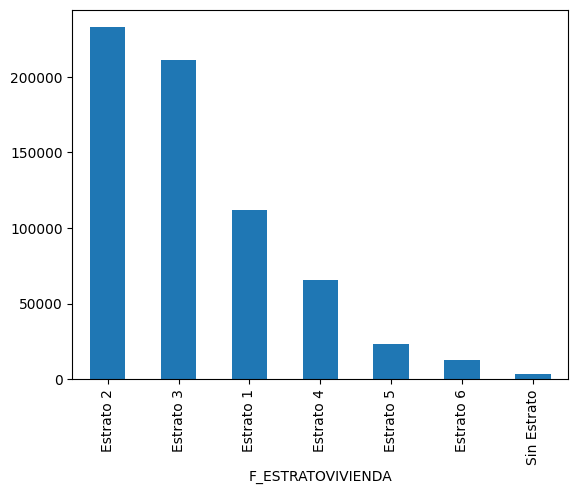

In [9]:
z.F_ESTRATOVIVIENDA.value_counts().plot(kind='bar')

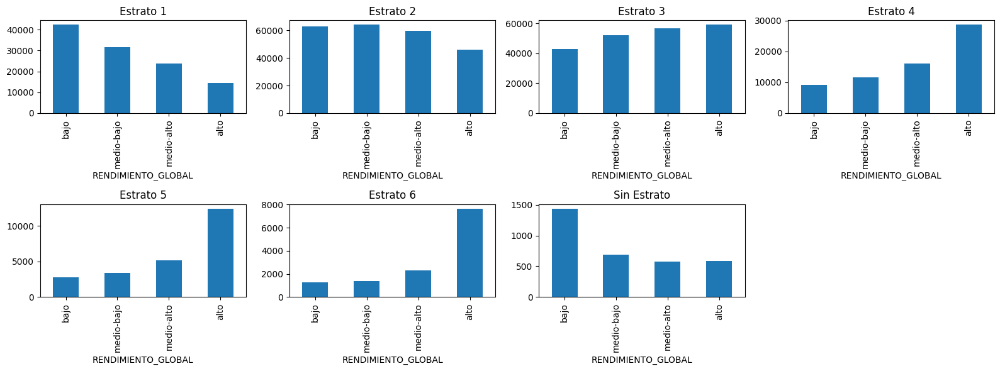

In [ ]:
from rlxutils import subplots
import matplotlib.pyplot as plt

c = sorted(z.F_ESTRATOVIVIENDA.value_counts().index)

for ax, ci in subplots(c, n_cols=4, usizex=4):
    zc = z[z.F_ESTRATOVIVIENDA == ci]
    zc.RENDIMIENTO_GLOBAL.value_counts()\
        .reindex(['bajo', 'medio-bajo', 'medio-alto', 'alto'], fill_value=0)\
        .plot(kind='bar', ax=ax)
    ax.set_title(ci)

## Veamos cuales son todos los programas y luego los clasificamos en grupos.

In [81]:
for programa in z['E_PRGM_ACADEMICO'].unique():
    print(programa)


ENFERMERIA
DERECHO
MERCADEO Y PUBLICIDAD
ADMINISTRACION DE EMPRESAS
PSICOLOGIA
MEDICINA VETERINARIA
INGENIERIA MECANICA
ADMINISTRACION EN SALUD OCUPACIONAL
INGENIERIA INDUSTRIAL
ADMINISTRACION FINANCIERA
HOTELERIA Y TURISMO
LICENCIATURA EN CIENCIAS SOCIALES
LICENCIATURA EN PEDAGOGIA INFANTIL
COMUNICACION SOCIAL
CIENCIA POLITICA
PROFESIONAL EN GESTION DE LA SEGURIDAD Y LA SALUD LABORAL
MAESTRO EN MUSICA
INGENIERIA MECATRONICA
TRABAJO SOCIAL
LICENCIATURA EN BIOLOGIA Y EDUCACION AMBIENTAL
INGENIERIA CIVIL
CONTADURIA PUBLICA
ADMINISTRACION EN SALUD
ESTADISTICA
LICENCIATURA EN BIOLOGIA
INGENIERIA AGROINDUSTRIAL
ZOOTECNIA
COMUNICACION AUDIOVISUAL
LICENCIATURA EN EDUCACION BASICA CON ENFASIS EN HUMANIDADES-INGLES
COMUNICACION SOCIAL  - PERIODISMO
SEGURIDAD Y SALUD EN EL TRABAJO
MEDICINA
ADMINISTRACION DE LA SEGURIDAD SOCIAL
ODONTOLOGIA
DISENO INDUSTRIAL
ECONOMIA
INGENIERIA DE PROCESOS INDUSTRIALES
INGENIERIA DE SISTEMAS
ARQUITECTURA
LICENCIATURA EN FILOSOFIA
ADMINISTRACION AMBIENTAL
INGENIERI

## Si se grafican todos los programas ocupa mucho tiempo y genera muchas graficas por lo que es necesario agruparlos

In [ ]:
from rlxutils import subplots
import matplotlib.pyplot as plt

c = sorted(z.E_PRGM_ACADEMICO.value_counts().index)

for ax, ci in subplots(c, n_cols=4, usizex=4):
    zc = z[z.E_PRGM_ACADEMICO == ci]
    zc.RENDIMIENTO_GLOBAL.value_counts()\
        .reindex(['bajo', 'medio-bajo', 'medio-alto', 'alto'], fill_value=0)\
        .plot(kind='bar', ax=ax)
    ax.set_title(ci)


### Cleaning `E_PRGM_ACADEMICO`

  Observe que para `E_PRGM_ACADEMICO` no hay datos faltantes, esto pudo deberse a que es obligación decir el programa academico cuando se presenta la prueba.

  De todas maneras vamos hacer una limpieza y a normalizar los programas.


In [85]:
!pip install unidecode
import unidecode

df = pd.read_csv("train.csv")
df['E_PRGM_ACADEMICO'] = df['E_PRGM_ACADEMICO'].str.upper().apply(lambda x: unidecode.unidecode(x.strip()))

categorias = {
    "INGENIERIA": ["INGENIERIA", "TECNOLOGIA", "ING"],
    "SALUD": ["ENFERMERIA", "MEDICINA", "VETERINARIA", "PSICOLOGIA", "ODONTOLOGIA", "SALUD"],
    "ADMINISTRACION": ["ADMINISTRACION", "FINANCIERA", "NEGOCIOS", "GERENCIA"],
    "DERECHO": ["DERECHO", "LEY"],
    "MERCADOTECNIA": ["MERCADEO", "PUBLICIDAD", "MARKETING"],
}

def clasificar_programa(nombre):
    for categoria, claves in categorias.items():
        for clave in claves:
            if clave in nombre:
                return categoria
    palabras = nombre.split()
    max_matches = 0
    mejor_categoria = None
    for categoria, claves in categorias.items():
        matches = sum(1 for palabra in palabras if any(clave in palabra for clave in claves))
        if matches > max_matches:
            max_matches = matches
            mejor_categoria = categoria
    return mejor_categoria if mejor_categoria else list(categorias.keys())[0]  # Siempre devuelve algo


df["CLASIFICACION"] = df["E_PRGM_ACADEMICO"].apply(clasificar_programa)
df.to_csv("train_clasificado.csv", index=False)

print(df[["E_PRGM_ACADEMICO", "CLASIFICACION"]].head(10))
print("Número de programas sin clasificar:", df["CLASIFICACION"].isna().sum())


                      E_PRGM_ACADEMICO   CLASIFICACION
0                           ENFERMERIA           SALUD
1                              DERECHO         DERECHO
2                MERCADEO Y PUBLICIDAD   MERCADOTECNIA
3           ADMINISTRACION DE EMPRESAS  ADMINISTRACION
4                           PSICOLOGIA           SALUD
5                 MEDICINA VETERINARIA           SALUD
6                  INGENIERIA MECANICA      INGENIERIA
7  ADMINISTRACION EN SALUD OCUPACIONAL           SALUD
8                INGENIERIA INDUSTRIAL      INGENIERIA
9           ADMINISTRACION DE EMPRESAS  ADMINISTRACION
Número de programas sin clasificar: 0


## Se grafica el número de estudiantes por categoria, esto permite trabajar de una mejor manera en el modelo.

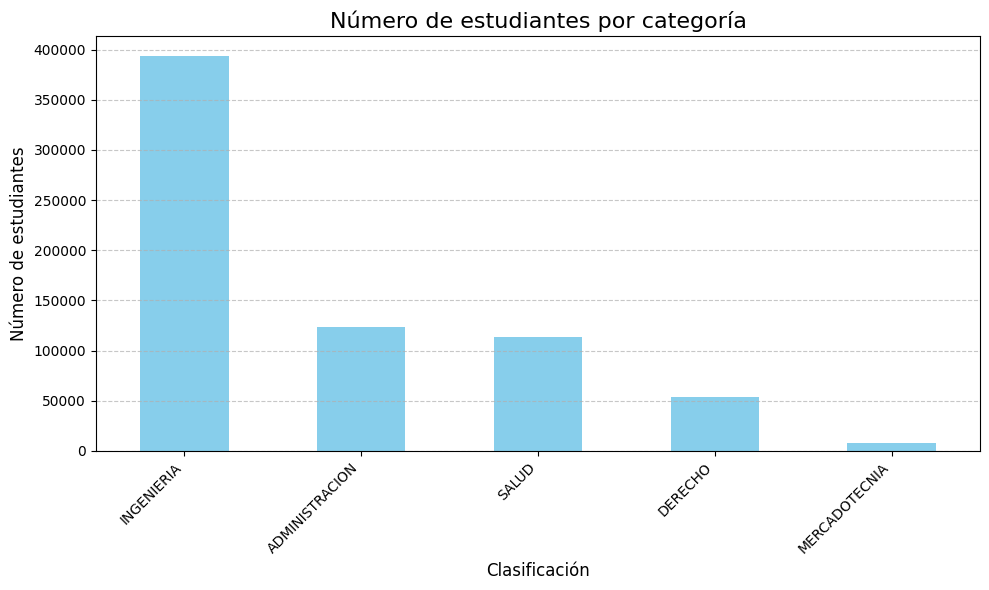

Total de estudiantes: 692500


In [58]:
import matplotlib.pyplot as plt
estudiantes_por_categoria = df.groupby("CLASIFICACION")["ID"].count().sort_values(ascending=False)
plt.figure(figsize=(10,6))
estudiantes_por_categoria.plot(kind='bar', color='skyblue')
plt.title('Número de estudiantes por categoría', fontsize=16)
plt.xlabel('Clasificación', fontsize=12)
plt.ylabel('Número de estudiantes', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

total_estudiantes = estudiantes_por_categoria.sum()
print("Total de estudiantes:", total_estudiantes)


In [87]:
import pandas as pd

# Calcular conteo por categoría
conteo = df["CLASIFICACION"].value_counts().reset_index()
conteo.columns = ["Categoria", "Numero_de_estudiantes"]

# Total de estudiantes
total = conteo["Numero_de_estudiantes"].sum()

# Calcular porcentaje
conteo["Porcentaje"] = (conteo["Numero_de_estudiantes"] / total).round(2)

# Mostrar resultados
print("Total de estudiantes:", total)
print(conteo)


Total de estudiantes: 692500
        Categoria  Numero_de_estudiantes  Porcentaje
0      INGENIERIA                 393994        0.57
1  ADMINISTRACION                 124051        0.18
2           SALUD                 113137        0.16
3         DERECHO                  53840        0.08
4   MERCADOTECNIA                   7478        0.01


In [88]:
df["CLASIFICACION"] = df["CLASIFICACION"].astype(str).str.strip().str.upper()

df["CLASIFICACION_CONTINUA"] = df["CLASIFICACION"].replace({
    "INGENIERIA": 0.569,
    "ADMINISTRACION": 0.179,
    "SALUD": 0.163,
    "DERECHO": 0.078,
    "MERCADOTECNIA": 0.011,
    "NO INFO": -1,
    "NO APLICA": -1,
    "NO SABE": -1
})

df["CLASIFICACION_CONTINUA"] = pd.to_numeric(df["CLASIFICACION_CONTINUA"], errors="coerce").fillna(-1)
print(df["CLASIFICACION_CONTINUA"].value_counts())


CLASIFICACION_CONTINUA
0.569    393994
0.179    124051
0.163    113137
0.078     53840
0.011      7478
Name: count, dtype: int64


/tmp/ipython-input-1636982582.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df["CLASIFICACION_CONTINUA"] = df["CLASIFICACION"].replace({


### Cleaning `F_ESTRATOVIVIENDA`

we convert `F_ESTRATOVIVIENDA` to a **continuous** value since the ordering makes sense and we would like models to have a chance to capture it.

observe we assign `no info` to -1, which is somewhat artificial in this case

In [74]:
z.loc[z.F_ESTRATOVIVIENDA.isna(), 'F_ESTRATOVIVIENDA'] = 'no info'
z.loc[z.E_PRGM_ACADEMICO.isna(), 'E_PRGM_ACADEMICO'] = 'no info'


/tmp/ipython-input-4101504903.py:1: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'no info' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  z.loc[z.F_ESTRATOVIVIENDA.isna(), 'F_ESTRATOVIVIENDA'] = 'no info'


In [89]:
z["F_ESTRATOVIVIENDA"] = z["F_ESTRATOVIVIENDA"].astype(str).str.strip().str.title()

z["F_ESTRATOVIVIENDA"] = z["F_ESTRATOVIVIENDA"].replace({
    'Estrato 1': 1,
    'Estrato 2': 2,
    'Estrato 3': 3,
    'Estrato 4': 4,
    'Estrato 5': 5,
    'Estrato 6': 6,
    'Sin Estrato': 0,
    'No Info': -1,
    'No Aplica': -1,
    'No Sabe': -1
})

z["F_ESTRATOVIVIENDA"] = pd.to_numeric(z["F_ESTRATOVIVIENDA"], errors="coerce").fillna(-1).astype(int)
print(z["F_ESTRATOVIVIENDA"].value_counts())


F_ESTRATOVIVIENDA
 2    232671
 3    210685
 1    111991
 4     65514
-1     32137
 5     23608
 6     12605
 0      3289
Name: count, dtype: int64


## Verificamos que las columna con las que vamos a trabajar esten limpias


In [76]:
sum(z.E_PRGM_ACADEMICO.isna()), sum(z.F_ESTRATOVIVIENDA.isna())

(0, 0)